In [1]:
#--------Reading Titles And Files--------------
title='Sonata26'
a='MIDI Score'
b='Arthur Rubinstein'
file1='sonata26.wav'
file2='Rubinstein.wav'
tuning=0

In [2]:
#------------importing modules------------
import numpy as np
import librosa 
import librosa.display
import scipy
import IPython.display as ipd
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from numba import jit
import wave  
import pyaudio
import os

In [3]:
def play_music(file):
    pygame.init()
    pygame.mixer.music.load(file)
    pygame.mixer.music.play()

In [4]:
def MIDItoWAV (song): 
    
    file_name = os.path.splitext(os.path.basename(song))[0]
    new_file = file_name + '.wav'
    
    print("Playing ")
    play_music(song)
        
    frames = []
        
    # Record frames while the song is playing
    while pygame.mixer.music.get_busy():
        frames.append(stream.read(buffer))
            
    # Stop recording
    stream.stop_stream()
    stream.close()
        
    # Configure wave file settings
    wave_file = wave.open(new_file, 'wb')
    wave_file.setnchannels(channels)
    wave_file.setsampwidth(audio.get_sample_size(format))
    wave_file.setframerate(sample_rate)
        
    print("Saving " + new_file)   
     
    # Write the frames to the wave file
    wave_file.writeframes(b''.join(frames))
    wave_file.close()

    # End PyAudio    
    audio.terminate()

In [5]:
#---------converting MIDI to WAV----------------
filetype = os.path.splitext(os.path.basename(file1))[1]

if filetype==".mid":
    sample_rate = 44100        
    channels = 1                
    buffer = 1024
    pa = pyaudio.PyAudio()
    x=pa.get_default_input_device_info()
    input_device=x['index']
    format = pyaudio.paInt16
    audio = pyaudio.PyAudio()
    stream = audio.open(format=format, channels=channels, rate=sample_rate, input=True, input_device_index=input_device,
                    frames_per_buffer=buffer)
    MIDItoWAV(file1)

In [6]:
newfile = os.path.splitext(os.path.basename(file1))[0]
file1=newfile+'.wav'

In [7]:
#----------------Reading signals-----------------
x1,fs1=librosa.load(file1)
x2,fs2=librosa.load(file2)

t1=np.arange(0,len(x1))/float(fs1)
t2=np.arange(0,len(x2))/float(fs2)

In [8]:
#-------------CENS Features - Normalized with Manhatann Norm-----------------------
l=41
chr1=librosa.feature.chroma_cens(y=x1,sr=fs1,norm=1,win_len_smooth=l)
if tuning==0:
    chr2=librosa.feature.chroma_cens(y=x2,sr=fs2,norm=1,win_len_smooth=l)
else:
    chr2=librosa.feature.chroma_cens(y=x2,sr=fs2,norm=1,tuning=tuning, win_len_smooth=l)

In [9]:
#---------------Cost Matrix----------------------
xt=np.transpose(chr1)
yt=np.transpose(chr2)
C = scipy.spatial.distance.cdist(yt,xt, 'cosine')

In [10]:
#-------------------Accumulated Cost Matrix---------------------

@jit(nopython=True)
def compute_accumulated_cost_matrix(C):

    N, M = C.shape
    D = np.zeros((N, M))
    D[:, 0] = np.cumsum(C[:, 0])
    D[0, :] = np.cumsum(C[0, :])
    for n in range(1, N):
        for m in range(1, M):
            D[n, m] = C[n, m] + min(D[n-1, m], D[n, m-1], D[n-1, m-1])
    return D

D =  compute_accumulated_cost_matrix(C)

In [11]:
#--------------Wapring Path------------
@jit(nopython=True)
def compute_optimal_warping_path(D):

    N, M = D.shape
    n = N - 1
    m = M - 1
    P = [(n, m)]

    while n > 0:
        if m == 0:
            cell = (n - 1, 0)
        else:
            val = min(D[n-1, m-1], D[n-1, m], D[n, m-1])
            if val == D[n-1, m-1]:
                cell = (n-1, m-1)
            elif val == D[n-1, m]:
                cell = (n-1, m)
            else:
                cell = (n, m-1)
        P.append(cell)
        n, m = cell
    P.reverse()
    return np.array(P)
        
path = compute_optimal_warping_path(D)

In [12]:
#----------Warping Path in Time Domain-------------------------
path_s = path * 512 / fs1 #512 is the hop size

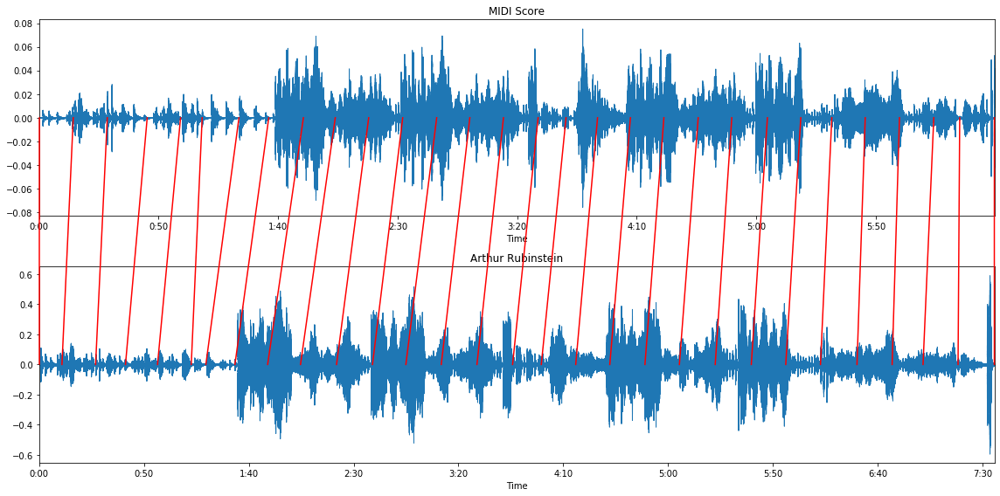

In [13]:
#Evaluating by Alligned Waveforms
fig = plt.figure(figsize=(16, 8))

# Plot x
plt.subplot(2, 1, 1)
librosa.display.waveplot(x1, sr=fs1)
plt.title(a)
ax1 = plt.gca()

# Plot y
plt.subplot(2, 1, 2)
librosa.display.waveplot(x2, sr=fs2)
plt.title(b)
ax2 = plt.gca()

plt.tight_layout()

trans_figure = fig.transFigure.inverted()
lines = []
arrows = 30
points_idx = np.int16(np.round(np.linspace(0, path_s.shape[0] - 1, arrows)))

# for tp1, tp2 in zip((wp[points_idx, 0]) * hop_size, (wp[points_idx, 1]) * hop_size):
for tp1, tp2 in path_s[points_idx]:
    # get position on axis for a given index-pair
    coord1 = trans_figure.transform(ax1.transData.transform([tp2, 0]))
    coord2 = trans_figure.transform(ax2.transData.transform([tp1, 0]))

    # draw a line
    line = matplotlib.lines.Line2D((coord1[0], coord2[0]),
                                   (coord1[1], coord2[1]),
                                   transform=fig.transFigure,
                                   color='r')
    lines.append(line)

fig.lines = lines
plt.tight_layout()

In [16]:
#----------Evaluating by Audio--------------------------
point=16453 #Starting chroma frame of first audio - must be between 0 and len(path2)

i2, i1 = librosa.frames_to_samples(path[point], hop_length=512) #512 is the default hop length
time1='%.2f' % (len(x1[0:i1])/fs1)
time2='%.2f' % (len(x2[0:i2])/fs2)
audio_tag1 = ipd.Audio(x1[i1:], rate=fs1)
audio_tag_html = audio_tag1._repr_html_().replace('\n', '').strip()
audio_tag_html = audio_tag_html.replace('<audio ', '<audio style="width: 200px"')
ipd.display(a+" Time = "+time1+" Seconds",ipd.HTML(audio_tag_html))
audio_tag2 = ipd.Audio(x2[i2:], rate=fs1)
audio_tag_html = audio_tag2._repr_html_().replace('\n', '').strip()
audio_tag_html = audio_tag_html.replace('<audio ', '<audio style="width: 200px"')
ipd.display(b+" Time = "+time2+" Seconds",ipd.HTML(audio_tag_html))


'MIDI Score Time = 303.11 Seconds'

'Arthur Rubinstein Time = 337.53 Seconds'